Imports

In [2]:
import csv
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os
from functools import reduce
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from IPython.display import display
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt 
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import datetime

All training data for PM10

In [3]:
data_PM10 = pd.read_csv('data_PM10_all_train.csv')

In [4]:
data_PM10 = data_PM10.drop('Unnamed: 0', axis = 1)

In [4]:
data_PM10.shape

(24580, 42)

# Attempt 1

In [5]:
data_PM10.columns

Index(['location', 'Date', 'PM10', 'Lat', 'Long', 'NDVI_8000_mean',
       'QA_8000_mean', 'TIMEOFDAY_8000_mean', 'NDVI_8000_min', 'QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'elevation_2000_mean', 'elevation_2000_min',
       'elevation_2000_max', 'avg_vis_mean', 'cf_cvg_mean', 'avg_vis_min',
       'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max', 'pop_density2010_mean',
       'pop_density2010_min', 'pop_density2010_max',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_NO2_slant_column_number_density',
       '0_stratospheric_NO2_column_number_density', '0_tropopause_pressure',
       '0_tropospheric_NO2_column_number_density',
       '1_O3_column_number_density', '2_CO_column_numb

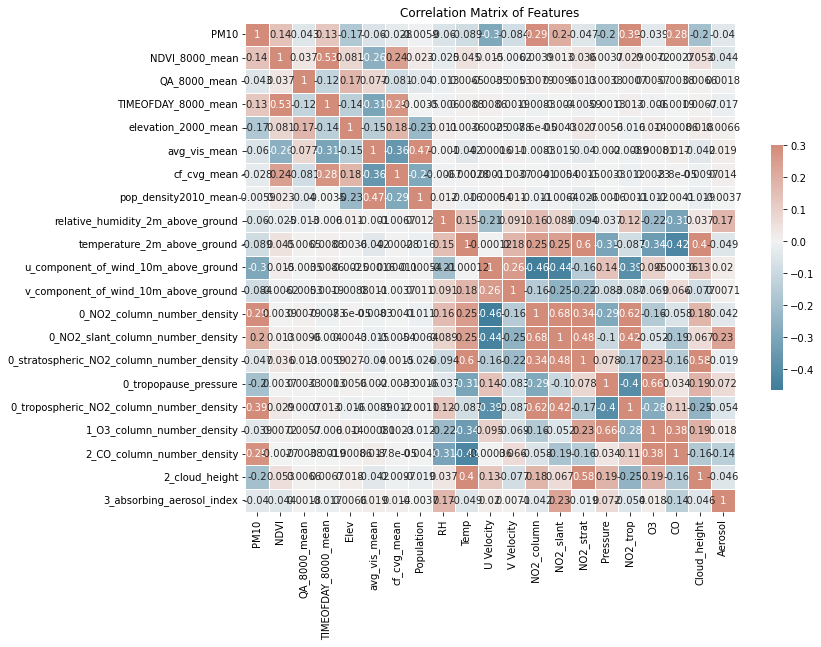

In [16]:
#create a correlation matrix

corr = data_PM10.drop(['location', 'Date', 'Lat', 'Long','QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'elevation_2000_min', 'elevation_2000_max','NDVI_8000_min', 'avg_vis_min', 'cf_cvg_min', 
    'avg_vis_max', 'cf_cvg_max','pop_density2010_min', 'pop_density2010_max','precipitable_water_entire_atmosphere',
      'specific_humidity_2m_above_ground','2_H2O_column_number_density' ], axis = 1).corr()
corr = corr.copy().rename(columns={'NDVI_8000_mean': 'NDVI', 'elevation_2000_mean': 'Elev',
       'relative_humidity_2m_above_ground': 'RH',
        'temperature_2m_above_ground': 'Temp',
       'u_component_of_wind_10m_above_ground': ' U Velocity',
       'v_component_of_wind_10m_above_ground': 'V Velocity', '0_NO2_column_number_density': ' NO2_column',
       '0_NO2_slant_column_number_density': 'NO2_slant',
       '0_stratospheric_NO2_column_number_density': 'NO2_strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2_trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
        '2_cloud_height': 'Cloud_height',
       '3_absorbing_aerosol_index': 'Aerosol', 'pop_density2010_mean':'Population'})
#mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(13, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap = cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)
plt.title('Correlation Matrix of Features');

Random Forest Regression

In [18]:
pipe_forest = Pipeline([
        ('scale', StandardScaler()), ('forest', RandomForestRegressor())])
pipe_forest.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'forest', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'forest__bootstrap', 'forest__ccp_alpha', 'forest__criterion', 'forest__max_depth', 'forest__max_features', 'forest__max_leaf_nodes', 'forest__max_samples', 'forest__min_impurity_decrease', 'forest__min_impurity_split', 'forest__min_samples_leaf', 'forest__min_samples_split', 'forest__min_weight_fraction_leaf', 'forest__n_estimators', 'forest__n_jobs', 'forest__oob_score', 'forest__random_state', 'forest__verbose', 'forest__warm_start'])

In [31]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
params = {'forest__n_estimators':[600]}

forest_search = GridSearchCV(pipe_forest,params,n_jobs=-1, cv=3,verbose=2)
forest_search.fit(X_train,y_train.values.ravel())

Fitting 3 folds for each of 1 candidates, totalling 3 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('forest', RandomForestRegressor())]),
             n_jobs=-1, param_grid={'forest__n_estimators': [600]}, verbose=2)

In [32]:
print('Score on train data: {}\n'.format(forest_search.score(X_train, y_train.values.ravel())))
print('Best parameters found:')
display(forest_search.best_params_)

Score on train data: 0.9587270326933504

Best parameters found:


{'forest__n_estimators': 600}

In [33]:
print('best cv score:')
display(forest_search.best_score_)

print('mean cv score:')
display(np.mean(forest_search.cv_results_["mean_test_score"]))

best cv score:


0.6752828900207654

mean cv score:


0.6752828900207654

In [34]:
forest_best_estim = forest_search.best_estimator_
print(forest_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('forest', RandomForestRegressor(n_estimators=600))])


In [35]:
forest_best_estim.fit(X_train, y_train)

forest_ytrain_pred = forest_best_estim.predict(X_train)
forest_rmse = np.sqrt(mean_squared_error(forest_ytrain_pred,  y_train.values.ravel()))
forest_r2 = r2_score(forest_ytrain_pred,y_train.values.ravel())
print("RMSE: %.2f" % forest_rmse)
print("R2: %.2f" % forest_r2)

RMSE: 1.65
R2: 0.95


In [27]:
data_PM10 = data_PM10.dropna()

In [109]:
X = data_PM10.drop(['location', 'Date', 'PM10', 'Lat', 'Long'], axis = 1)

# X = data_PM10.drop(['location', 'Date', 'PM10', 'Lat', 'Long','QA_8000_min',
#        'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
#        'TIMEOFDAY_8000_max', 'QA_8000_min',
#        'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
#        'TIMEOFDAY_8000_max', 'elevation_2000_min', 'elevation_2000_max','NDVI_8000_min', 'avg_vis_min', 'cf_cvg_min', 
#     'avg_vis_max', 'cf_cvg_max','pop_density2010_min', 'pop_density2010_max','precipitable_water_entire_atmosphere',
#       'specific_humidity_2m_above_ground','2_H2O_column_number_density'], axis = 1)

In [110]:
y = data_PM10['PM10']

In [111]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [42]:
test_data_all = pd.read_csv('test_data_all.csv')

In [44]:
test_data_all = test_data_all.drop('Unnamed: 0', axis = 1)

In [51]:
test_data_all = test_data_all.fillna(76.3)

In [55]:
X_test_test = test_data_all.drop(['country','city','location', 'Date', 'Lat', 'Long','QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'elevation_2000_min', 'elevation_2000_max','NDVI_8000_min', 'avg_vis_min', 'cf_cvg_min', 
    'avg_vis_max', 'cf_cvg_max','pop_density2010_min', 'pop_density2010_max','precipitable_water_entire_atmosphere',
      'specific_humidity_2m_above_ground','2_H2O_column_number_density'], axis = 1)

In [61]:
predicted_pm10 = forest_best_estim.predict(X_test_test)

In [63]:
predicted_pm10 = pd.DataFrame(predicted_pm10, columns = ['Predicted PM10'])

In [100]:
coordinates = pd.read_csv('Coordinates_updated_long-Copy1.csv')

In [69]:
coordinates.shape

(464, 6)

In [73]:
correlation = pd.DataFrame.join(predicted_pm10, coordinates['location'])

In [82]:
correlation_groupby = correlation.groupby('location',sort = False, as_index=False).mean(lambda x: set(x))

In [85]:
respiratory = [749,721,797,935,926,610,845,708,554,680,655,652,736,553,585,
618,637,711,823,639,806,808,1087,689,651,681,628,615,608,676,619,573,835,733,
733,896,681,941,863,600,567,739,850,852,859,]

In [86]:
respiratory_disease = pd.DataFrame(respiratory, columns = ['Respiratory'])

In [87]:
correlation_groupby = correlation_groupby.join(respiratory_disease)

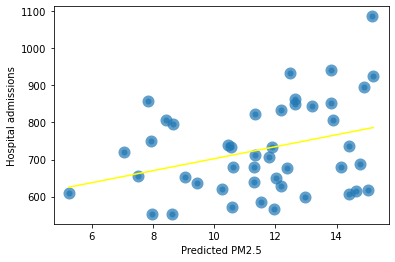

In [90]:
x = correlation_groupby['Predicted PM10']
y = correlation_groupby['Respiratory']
plt.scatter(x = x, y = y, lw = 6, alpha = 0.7)
plt.xlabel('Predicted PM10')
plt.ylabel('Hospital admissions')
plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color = 'yellow')

In [92]:
from scipy.stats import pearsonr
pearsonr(correlation_groupby['Predicted PM10'],
         correlation_groupby['Respiratory'])[0]

0.32962058256900595

In [93]:
asthma = [75,34,49,72,69,45,42,49,43,45,42,53,48,34,38,38,46,59,63,32,58,45,85,
39,36,37,40,41,36,33,32,37,52,66,45,51,42,62,49,35,31,46,49,61,47]

In [94]:
asthma_df = pd.DataFrame(asthma, columns = ['Asthma'])

In [95]:
correlation_groupby = correlation_groupby.join(asthma_df)

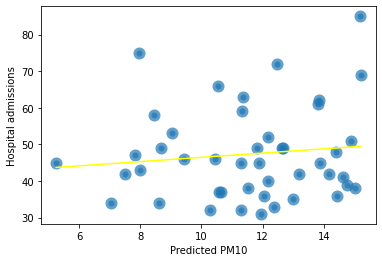

In [97]:
x = correlation_groupby['Predicted PM10']
y = correlation_groupby['Asthma']
plt.scatter(x = x, y = y, lw = 6, alpha = 0.7)
plt.xlabel('Predicted PM10')
plt.ylabel('Hospital admissions')
plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color = 'yellow')

In [98]:
pearsonr(correlation_groupby['Predicted PM10'],
         correlation_groupby['Asthma'])[0]

0.11594594924165007

Recursive Feature Elimination

In [3]:
data_PM10 = pd.read_csv('data_PM10_all_train.csv')

In [4]:
data_PM10.columns

Index(['Unnamed: 0', 'location', 'Date', 'PM10', 'Lat', 'Long',
       'NDVI_8000_mean', 'QA_8000_mean', 'TIMEOFDAY_8000_mean',
       'NDVI_8000_min', 'QA_8000_min', 'TIMEOFDAY_8000_min', 'NDVI_8000_max',
       'QA_8000_max', 'TIMEOFDAY_8000_max', 'elevation_2000_mean',
       'elevation_2000_min', 'elevation_2000_max', 'avg_vis_mean',
       'cf_cvg_mean', 'avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
       'pop_density2010_mean', 'pop_density2010_min', 'pop_density2010_max',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_NO2_slant_column_number_density',
       '0_stratospheric_NO2_column_number_density', '0_tropopause_pressure',
       '0_tropospheric_NO2_column_number_density',
       '1_O3_column_number_density', '2_

In [5]:
data_PM10_model_features = data_PM10.drop(['Unnamed: 0', 'location', 'Date', 'Lat', 'Long'], axis = 1)

In [6]:
data_PM10_model_features = data_PM10_model_features.dropna()

In [7]:
X = data_PM10_model_features.drop('PM10', axis = 1)

In [8]:
y = data_PM10_model_features['PM10']

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [10]:
X_train.shape, X_test.shape

((17203, 37), (7374, 37))

In [12]:
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import RFE

Using Select from model for feature selection with a Random Forest regressor

In [13]:
sel = SelectFromModel(RandomForestRegressor(n_estimators= 100, random_state= 0, n_jobs = -1))
sel.fit(X_train, y_train)
sel.get_support()

array([False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
        True, False, False,  True,  True, False,  True, False,  True,
       False])

In [14]:
features = X_train.columns[sel.get_support()]

In [17]:
features

Index(['NDVI_8000_max', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_tropopause_pressure', '0_tropospheric_NO2_column_number_density',
       '2_CO_column_number_density', '2_cloud_height'],
      dtype='object')

In [18]:
X_train_rfc = sel.transform(X_train)
X_test_rfc = sel.transform(X_test)

In [25]:
from sklearn import metrics

In [76]:
def randomForest(X_train, X_test, y_train, y_test):
    clf = RandomForestRegressor(n_estimators= 100, random_state= 100, n_jobs = -1)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
    print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('R2 score: ', metrics.r2_score(y_test, y_pred))

In [31]:
%%time

randomForest(X_train_rfc, X_test_rfc, y_train, y_test)

Mean Absolute Error: 3.5066460922732157
Mean Squared Error: 24.624573785779045
Root Mean Squared Error: 4.9623153654094825
Wall time: 1.08 s


In [32]:
%%time

randomForest(X_train, X_test, y_train, y_test)

Mean Absolute Error: 2.95704836467761
Mean Squared Error: 17.816788996120064
Root Mean Squared Error: 4.220993839858104
Wall time: 2.67 s


In [34]:
sel = RFE(RandomForestRegressor(n_estimators= 100, random_state= 0, n_jobs = -1), n_features_to_select = 15)
sel.fit(X_train, y_train)

RFE(estimator=RandomForestRegressor(n_jobs=-1, random_state=0),
    n_features_to_select=15)

In [35]:
features = X_train.columns[sel.get_support()]

In [36]:
features

Index(['NDVI_8000_min', 'NDVI_8000_max', 'elevation_2000_mean',
       'elevation_2000_max', 'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_tropopause_pressure', '0_tropospheric_NO2_column_number_density',
       '2_CO_column_number_density', '2_H2O_column_number_density',
       '2_cloud_height'],
      dtype='object')

In [37]:
X_train_rfe = sel.transform(X_train)
X_test_rfe = sel.transform(X_test)

In [38]:
%%time

randomForest(X_train_rfe, X_test_rfe, y_train, y_test)

Mean Absolute Error: 3.1262677697711583
Mean Squared Error: 19.919167777030733
Root Mean Squared Error: 4.463089487903052
Wall time: 1.7 s


In [39]:
%%time

randomForest(X_train, X_test, y_train, y_test)

Mean Absolute Error: 2.95704836467761
Mean Squared Error: 17.816788996120064
Root Mean Squared Error: 4.220993839858104
Wall time: 2.92 s


In [40]:
sel = RFE(GradientBoostingRegressor(n_estimators= 100, random_state= 0), n_features_to_select = 15)
sel.fit(X_train, y_train)

RFE(estimator=GradientBoostingRegressor(random_state=0),
    n_features_to_select=15)

In [41]:
features = X_train.columns[sel.get_support()]

In [42]:
features

Index(['NDVI_8000_mean', 'QA_8000_mean', 'NDVI_8000_min', 'NDVI_8000_max',
       'elevation_2000_mean', 'elevation_2000_min', 'avg_vis_min',
       'temperature_2m_above_ground', 'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_tropopause_pressure', '0_tropospheric_NO2_column_number_density',
       '2_CO_column_number_density', '2_cloud_height'],
      dtype='object')

In [43]:
X_train_rfe = sel.transform(X_train)
X_test_rfe = sel.transform(X_test)

In [44]:
%%time

randomForest(X_train_rfe, X_test_rfe, y_train, y_test)

Mean Absolute Error: 3.0653556141724807
Mean Squared Error: 19.121837879586234
Root Mean Squared Error: 4.372852373404141
Wall time: 1.36 s


In [45]:
%%time

randomForest(X_train, X_test, y_train, y_test)

Mean Absolute Error: 2.95704836467761
Mean Squared Error: 17.816788996120064
Root Mean Squared Error: 4.220993839858104
Wall time: 2.77 s


In [54]:
for i in range(1,38):
    sel = RFE(GradientBoostingRegressor(n_estimators= 100, random_state= 0), n_features_to_select = i)
    sel.fit(X_train, y_train)
    X_train_rfe = sel.transform(X_train)
    X_test_rfe = sel.transform(X_test)
    print('Selected Feature: ', i)
    randomForest(X_train_rfe, X_test_rfe, y_train, y_test)
    print()

Selected Feature:  1
Mean Absolute Error: 5.404342544855759
Mean Squared Error: 58.04572304964728
Root Mean Squared Error: 7.618774379757369

Selected Feature:  2
Mean Absolute Error: 5.187816199023263
Mean Squared Error: 49.837833754790196
Root Mean Squared Error: 7.059591613881797

Selected Feature:  3
Mean Absolute Error: 4.3731277484770406
Mean Squared Error: 37.91970007603838
Root Mean Squared Error: 6.157897374594544

Selected Feature:  4
Mean Absolute Error: 3.8470802598634957
Mean Squared Error: 28.382089530686194
Root Mean Squared Error: 5.327484352927392

Selected Feature:  5
Mean Absolute Error: 3.6019329540266294
Mean Squared Error: 24.955441572827855
Root Mean Squared Error: 4.995542170058006

Selected Feature:  6
Mean Absolute Error: 3.327133135291305
Mean Squared Error: 21.930596121718974
Root Mean Squared Error: 4.683011437282529

Selected Feature:  7
Mean Absolute Error: 3.3226855308947227
Mean Squared Error: 21.821754626752313
Root Mean Squared Error: 4.67137609562239

In [55]:
sel = RFE(GradientBoostingRegressor(n_estimators= 100, random_state= 0), n_features_to_select = 19)
sel.fit(X_train, y_train)
X_train_rfe = sel.transform(X_train)
X_test_rfe = sel.transform(X_test)
print('Selected Feature: ', i)
randomForest(X_train_rfe, X_test_rfe, y_train, y_test)
print()

Selected Feature:  37
Mean Absolute Error: 3.0171020286588006
Mean Squared Error: 18.383024227109974
Root Mean Squared Error: 4.287542912567753



In [56]:
X_train.columns[sel.get_support()]

Index(['NDVI_8000_mean', 'QA_8000_mean', 'NDVI_8000_min', 'TIMEOFDAY_8000_min',
       'NDVI_8000_max', 'elevation_2000_mean', 'elevation_2000_min',
       'elevation_2000_max', 'avg_vis_mean', 'avg_vis_min',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_tropopause_pressure', '0_tropospheric_NO2_column_number_density',
       '2_CO_column_number_density', '2_cloud_height'],
      dtype='object')

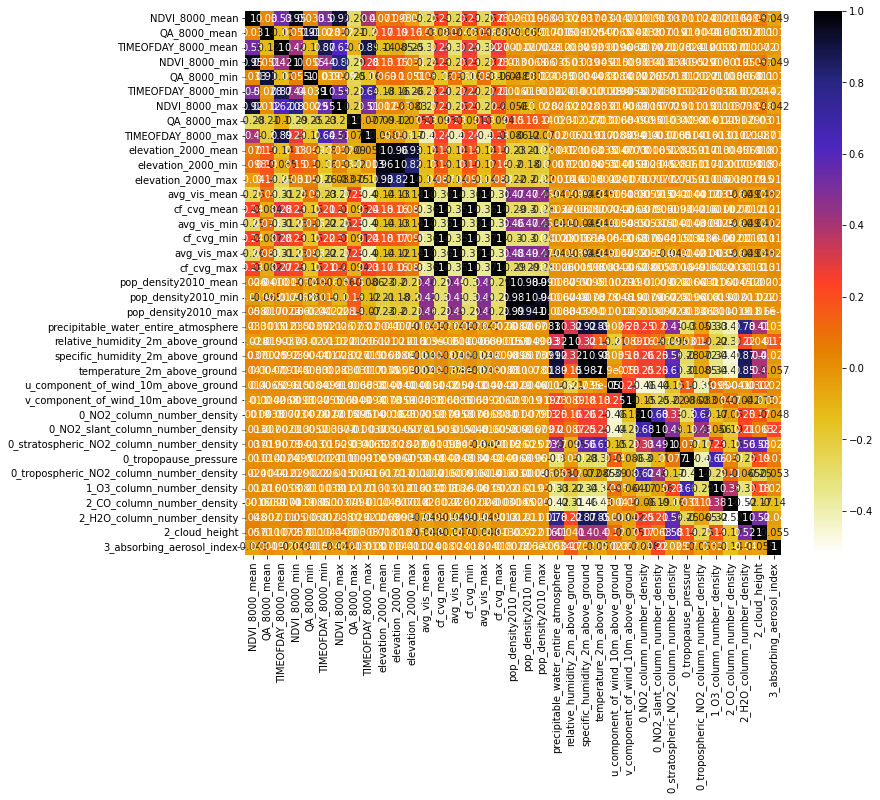

In [57]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [59]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [69]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

16

In [71]:
corr_features

{'2_H2O_column_number_density',
 'NDVI_8000_max',
 'NDVI_8000_min',
 'QA_8000_min',
 'TIMEOFDAY_8000_max',
 'TIMEOFDAY_8000_min',
 'avg_vis_max',
 'avg_vis_min',
 'cf_cvg_max',
 'cf_cvg_min',
 'elevation_2000_max',
 'elevation_2000_min',
 'pop_density2010_max',
 'pop_density2010_min',
 'specific_humidity_2m_above_ground',
 'temperature_2m_above_ground'}

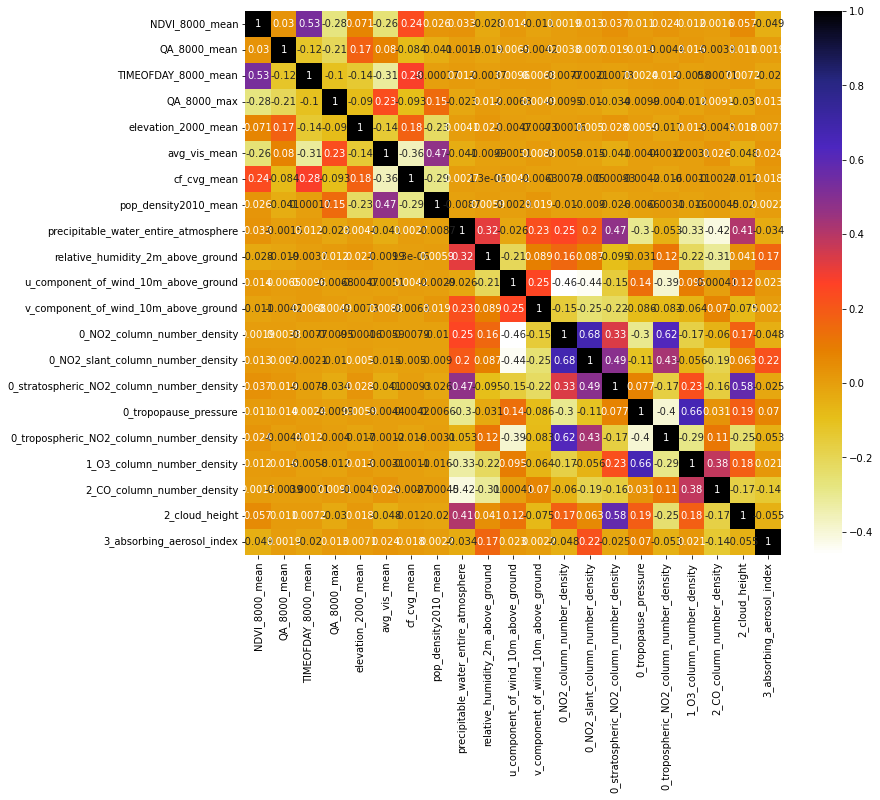

In [72]:
plt.figure(figsize=(12,10))
cor = X_train.drop(corr_features,axis=1).corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [77]:
sel = RFE(GradientBoostingRegressor(n_estimators= 100, random_state= 0), n_features_to_select = 12)
sel.fit(X_train.drop(corr_features,axis=1), y_train)
X_train_rfe = sel.transform(X_train.drop(corr_features,axis=1))
X_test_rfe = sel.transform(X_test.drop(corr_features,axis=1))
# print('Selected Feature: ', i)
randomForest(X_train_rfe, X_test_rfe, y_train, y_test)
print()

Mean Absolute Error: 3.131946211375232
Mean Squared Error: 19.872633788355323
Root Mean Squared Error: 4.457873236012361
R2 score:  0.698770377370932



In [81]:
test_data_all = pd.read_csv('test_data_all.csv')
test_data_all = test_data_all.drop('Unnamed: 0', axis = 1)
test_data_all = test_data_all.fillna(76.3)

In [82]:
test_data_all.columns

Index(['location', 'Date', 'city', 'country', 'Lat', 'Long', 'NDVI_8000_mean',
       'QA_8000_mean', 'TIMEOFDAY_8000_mean', 'NDVI_8000_min', 'QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'elevation_2000_mean', 'elevation_2000_min',
       'elevation_2000_max', 'avg_vis_mean', 'cf_cvg_mean', 'avg_vis_min',
       'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max', 'pop_density2010_mean',
       'pop_density2010_min', 'pop_density2010_max',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_NO2_slant_column_number_density',
       '0_stratospheric_NO2_column_number_density', '0_tropopause_pressure',
       '0_tropospheric_NO2_column_number_density',
       '1_O3_column_number_density', '2_CO_

In [84]:
X_test_PM10 = test_data_all.drop(['location', 'Date', 'city', 'country', 'Lat', 'Long'], axis = 1)

In [88]:
X_test_PM10.drop(corr_features, axis = 1).shape

(464, 21)

In [96]:
clf = RandomForestRegressor(n_estimators= 100, random_state= 100, n_jobs = -1)
clf.fit(X_train_rfe, y_train)
y_pred = clf.predict(X_test_PM10_transform)
# print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
# print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
# print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
# print('R2 score: ', metrics.r2_score(y_test, y_pred))

In [92]:
X_test_PM10_transform = sel.transform(X_test_PM10.drop(corr_features,axis=1))

In [99]:
predict_pm10 = pd.DataFrame(y_pred, columns = ['Predicted PM10'])

In [102]:
correlation = pd.DataFrame.join(predict_pm10, coordinates['location'])

In [103]:
correlation_groupby = correlation.groupby('location',sort = False, as_index=False).mean(lambda x: set(x))

In [104]:
respiratory = [749,721,797,935,926,610,845,708,554,680,655,652,736,553,585,
618,637,711,823,639,806,808,1087,689,651,681,628,615,608,676,619,573,835,733,
733,896,681,941,863,600,567,739,850,852,859,]
respiratory_disease = pd.DataFrame(respiratory, columns = ['Respiratory'])
correlation_groupby = correlation_groupby.join(respiratory_disease)

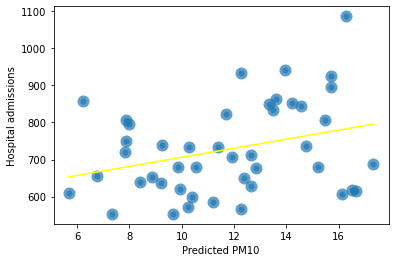

In [106]:
x = correlation_groupby['Predicted PM10']
y = correlation_groupby['Respiratory']
plt.scatter(x = x, y = y, lw = 6, alpha = 0.7)
plt.xlabel('Predicted PM10')
plt.ylabel('Hospital admissions')
plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color = 'yellow')

In [107]:
from scipy.stats import pearsonr
pearsonr(correlation_groupby['Predicted PM10'],
         correlation_groupby['Respiratory'])[0]

0.31250127711744363

0.12172240537521534

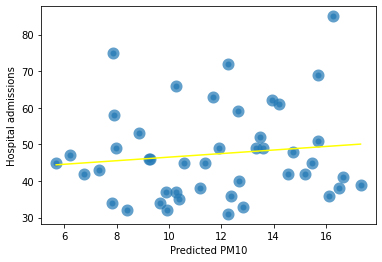

In [108]:
asthma = [75,34,49,72,69,45,42,49,43,45,42,53,48,34,38,38,46,59,63,32,58,45,85,
39,36,37,40,41,36,33,32,37,52,66,45,51,42,62,49,35,31,46,49,61,47]
asthma_df = pd.DataFrame(asthma, columns = ['Asthma'])
correlation_groupby = correlation_groupby.join(asthma_df)

x = correlation_groupby['Predicted PM10']
y = correlation_groupby['Asthma']
plt.scatter(x = x, y = y, lw = 6, alpha = 0.7)
plt.xlabel('Predicted PM10')
plt.ylabel('Hospital admissions')
plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color = 'yellow')

pearsonr(correlation_groupby['Predicted PM10'],
         correlation_groupby['Asthma'])[0]

# Attempt 2

In [5]:
data_PM10 = pd.read_csv('data_PM10_all_train.csv')
data_PM10 = data_PM10.drop('Unnamed: 0', axis = 1)
data_PM10 = data_PM10.dropna()

In [6]:
data_PM10.columns

Index(['location', 'Date', 'PM10', 'Lat', 'Long', 'NDVI_8000_mean',
       'QA_8000_mean', 'TIMEOFDAY_8000_mean', 'NDVI_8000_min', 'QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'elevation_2000_mean', 'elevation_2000_min',
       'elevation_2000_max', 'avg_vis_mean', 'cf_cvg_mean', 'avg_vis_min',
       'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max', 'pop_density2010_mean',
       'pop_density2010_min', 'pop_density2010_max',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_NO2_slant_column_number_density',
       '0_stratospheric_NO2_column_number_density', '0_tropopause_pressure',
       '0_tropospheric_NO2_column_number_density',
       '1_O3_column_number_density', '2_CO_column_numb

In [7]:
X = data_PM10.drop(['location', 'Lat', 'Long', 'PM10'], axis = 1)

In [8]:
y = data_PM10['PM10']

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
X_train = X_train.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)

In [11]:
X_train = X_train.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})

In [12]:
X_train.shape

(19661, 23)

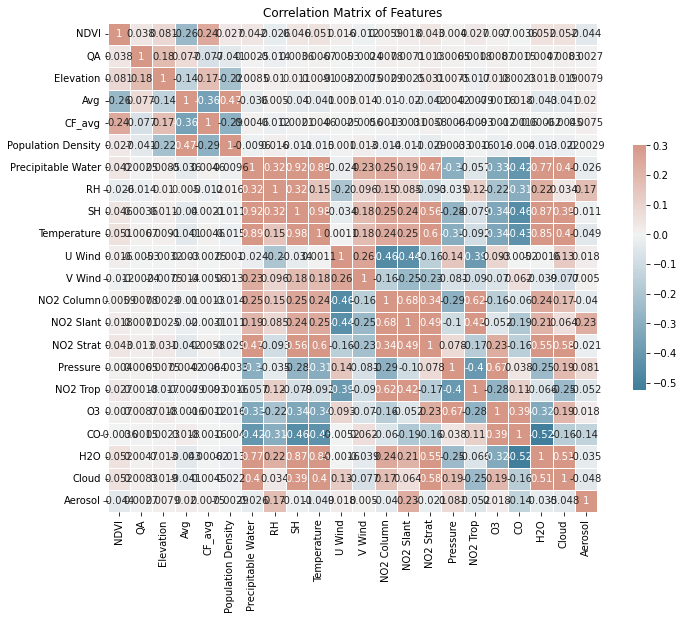

In [13]:
#create a correlation matrix

corr = X_train.corr()
#mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(13, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap = cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)
plt.title('Correlation Matrix of Features');

In [14]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [15]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

3

In [16]:
corr_features

{'H2O', 'SH', 'Temperature'}

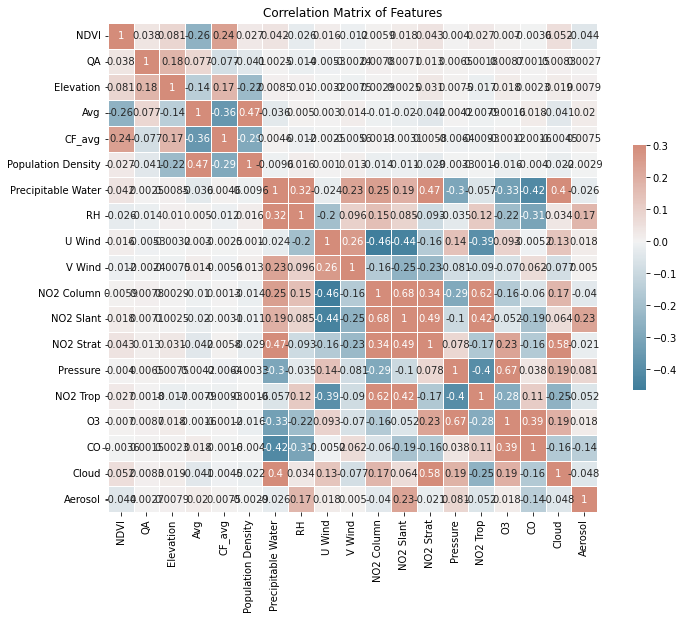

In [17]:
corr = X_train.drop(corr_features, axis = 1).corr()
#mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(13, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap = cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)
plt.title('Correlation Matrix of Features');

In [18]:
X_train = X_train.drop(corr_features, axis = 1)

In [19]:

test_data_all = pd.read_csv('test_data_all.csv')
test_data_all = test_data_all.drop('Unnamed: 0', axis = 1)
test_data_all = test_data_all.fillna(76.3)

X_test_coord = test_data_all.drop(['location', 'Date', 'city', 'country'], axis = 1)

X_test_coord = X_test_coord.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)


X_test_coord = X_test_coord.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})

In [20]:
X_test_coord = X_test_coord.drop(corr_features, axis =1)

In [21]:
# X_test = X_test.drop(['location', 'Date', 'city', 'country', 'Lat', 'Long',], axis = 1)

X_test = X_test.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)
X_test = X_test.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})


X_test = X_test.drop(corr_features, axis =1)

In [22]:
X_train.shape, X_test_coord.shape, X_test.shape

((19661, 20), (464, 21), (4916, 20))

# Decision Tree

In [22]:
pipe_tree = Pipeline([
        ('scale', StandardScaler()), ('tree', DecisionTreeRegressor())])

#hypterparameter tuning
grid_params = {'tree__max_depth':[3,4,5,6,7],
               'tree__max_features':['auto','sqrt','log2'],
         'tree__min_samples_split':[2,3,4,5,6,7,8,9,10],
         'tree__min_samples_leaf':[2,3,4,5,6,7,8,9,10]}   
     
tree_search = GridSearchCV(pipe_tree, grid_params, verbose=1, cv=5, n_jobs=-1)

In [39]:
import time
start_time = time.time()
# tree_search.fit(X_train.drop('Date', axis = 1), y_train.values.ravel())
tree_search.fit(X_train.drop('Date', axis = 1),y_train.values.ravel())
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1215 candidates, totalling 6075 fits
--- 33.62017464637756 seconds ---


In [40]:
print('Best parameters found:')
display(tree_search.best_params_)

Best parameters found:


{'tree__max_depth': 7,
 'tree__max_features': 'auto',
 'tree__min_samples_leaf': 4,
 'tree__min_samples_split': 3}

In [41]:
print('Score on train data: {}\n'.format(tree_search.score(X_train.drop('Date', axis = 1),y_train.values.ravel())))

Score on train data: 0.5308824370519658



In [42]:
print('best cv score:')
display(tree_search.best_score_)

print('mean cv score:')
display(np.mean(tree_search.cv_results_["mean_test_score"]))

best cv score:


0.47196556422521996

mean cv score:


0.3379222814789766

In [31]:
tree_best_estim = tree_search.best_estimator_
print(tree_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('tree',
                 DecisionTreeRegressor(max_depth=7, max_features='auto',
                                       min_samples_leaf=4,
                                       min_samples_split=7))])


In [32]:
tree_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

tree_ytrain_pred = tree_best_estim.predict(X_train.drop('Date', axis = 1))

In [44]:
tree_search.best_params_

{'tree__max_depth': 7,
 'tree__max_features': 'auto',
 'tree__min_samples_leaf': 4,
 'tree__min_samples_split': 3}

In [46]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_dtree_df = pd.DataFrame(y_pred_dtree, columns = ['Dtree'])
dtree_outlier = pd.DataFrame.join(y_test_outlier, y_pred_dtree_df).reset_index()
# rf_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
dtree_outlier = dtree_outlier[dtree_outlier['PM10']< 70]
#
df = dtree_outlier
fig = px.scatter(df, x='PM10', y='Dtree', trendline="ols", trendline_color_override = 'red',
                labels={
                     "Dtree": " Predicted PM 10 Concentration (μg/m3)",
                     "PM10": "Ground Measurement PM 10 (μg/m3)"})

fig.update_layout(title_text='Decision Tree PM 10 Concentration against Ground Measurements')
fig.show()

In [36]:
X_test_coord.columns

Index(['Lat', 'Long', 'NDVI', 'QA', 'Elevation', 'Avg', 'CF_avg',
       'Population Density', 'Precipitable Water', 'RH', 'U Wind', 'V Wind',
       'NO2 Column', 'NO2 Slant', 'NO2 Strat', 'Pressure', 'NO2 Trop', 'O3',
       'CO', 'Cloud', 'Aerosol'],
      dtype='object')

In [48]:
y_pred_dtree_coord = tree_best_estim.predict(X_test_coord.drop(['Lat', 'Long'], axis = 1))

In [49]:
y_pred_dtree = tree_best_estim.predict(X_test.drop('Date', axis = 1))

In [51]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error


dtree_rmse = np.sqrt(mean_squared_error(tree_ytrain_pred,  y_train.values.ravel()))
dtree_r2 = r2_score(tree_ytrain_pred,y_train.values.ravel())
dtree_mae = mean_absolute_error(tree_ytrain_pred,  y_train.values.ravel())
dtree_mse = mean_squared_error(tree_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % dtree_rmse)
print("MSE: %.2f" % dtree_mse)
print("MAE: %.2f" % dtree_mae)
print("R2: %.2f" % dtree_r2)

RMSE: 5.56
MSE: 30.90
MAE: 3.97
R2: 0.12


# Random Forest

In [22]:
pipe_forest = Pipeline([
        ('scale', StandardScaler()), ('forest', RandomForestRegressor())])
pipe_forest.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'forest', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'forest__bootstrap', 'forest__ccp_alpha', 'forest__criterion', 'forest__max_depth', 'forest__max_features', 'forest__max_leaf_nodes', 'forest__max_samples', 'forest__min_impurity_decrease', 'forest__min_impurity_split', 'forest__min_samples_leaf', 'forest__min_samples_split', 'forest__min_weight_fraction_leaf', 'forest__n_estimators', 'forest__n_jobs', 'forest__oob_score', 'forest__random_state', 'forest__verbose', 'forest__warm_start'])

In [23]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
import time
start_time = time.time()
params = {'forest__n_estimators':[600]}

forest_search = GridSearchCV(pipe_forest,params,n_jobs=-1, cv=5,verbose=2)
forest_search.fit(X_train.drop('Date', axis = 1),y_train.values.ravel())
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
--- 220.0133399963379 seconds ---


In [26]:
print('Score on train data: {}\n'.format(forest_search.score(X_train.drop('Date', axis = 1), y_train.values.ravel())))
print('Best parameters found:')
display(forest_search.best_params_)

Score on train data: 0.9589992458117735

Best parameters found:


{'forest__n_estimators': 600}

In [27]:
print('best cv score:')
display(forest_search.best_score_)

print('mean cv score:')
display(np.mean(forest_search.cv_results_["mean_test_score"]))

best cv score:


0.6866985829708168

mean cv score:


0.6866985829708168

In [28]:
forest_best_estim = forest_search.best_estimator_
print(forest_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('forest', RandomForestRegressor(n_estimators=600))])


In [29]:
forest_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

forest_ytrain_pred = forest_best_estim.predict(X_train.drop('Date', axis = 1))


In [36]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error


forest_rmse = np.sqrt(mean_squared_error(forest_ytrain_pred,  y_train.values.ravel()))
forest_r2 = r2_score(forest_ytrain_pred,y_train.values.ravel())
forest_mae = mean_absolute_error(forest_ytrain_pred,  y_train.values.ravel())
forest_mse = mean_squared_error(forest_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % forest_rmse)
print("MSE: %.2f" % forest_mse)
print("MAE: %.2f" % forest_mae)
print("R2: %.2f" % forest_r2)

RMSE: 1.64
MSE: 2.69
MAE: 1.11
R2: 0.95


In [33]:
X_test_coord.columns

Index(['Lat', 'Long', 'NDVI', 'QA', 'Elevation', 'Avg', 'CF_avg',
       'Population Density', 'Precipitable Water', 'RH', 'U Wind', 'V Wind',
       'NO2 Column', 'NO2 Slant', 'NO2 Strat', 'Pressure', 'NO2 Trop', 'O3',
       'CO', 'Cloud', 'Aerosol'],
      dtype='object')

In [35]:
y_pred_rforest_coord = forest_best_estim.predict(X_test_coord.drop(['Lat', 'Long'], axis = 1))

In [36]:
y_pred_rforest = forest_best_estim.predict(X_test.drop('Date', axis =1))

In [50]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_rforest_df = pd.DataFrame(y_pred_rforest, columns = ['Random Forest'])
rf_outlier = pd.DataFrame.join(y_test_outlier, y_pred_rforest_df).reset_index()
# rf_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
rf_outlier = rf_outlier[rf_outlier['PM10']< 70]
#
df = rf_outlier
fig = px.scatter(df, x='PM10', y='Random Forest', trendline="ols", trendline_color_override = 'red',
                labels={
                     "Random Forest": " Predicted PM 10 Concentration (μg/m3)",
                     "PM10": "Ground Measurement PM 10 (μg/m3)"})

fig.update_layout(title_text='Random Forest PM 10 Concentration against Ground Measurements')
fig.show()

In [40]:
# get importance
forest_importance = forest_best_estim.coef_[0]
# summarize feature importance
for i,v in enumerate(forest_importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(forest_importance))], forest_importance)
pyplot.show()

AttributeError: 'Pipeline' object has no attribute 'coef_'

In [157]:
forest_best_estim.feature_importances_

AttributeError: 'Pipeline' object has no attribute 'feature_importances_'

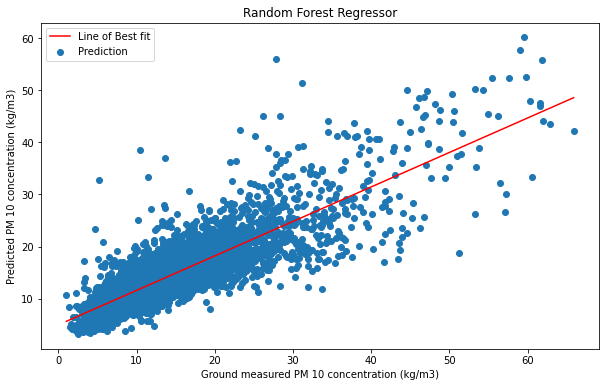

In [76]:
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_rforest = pd.DataFrame(y_pred_rforest, columns = ['Rforest'])
rforest_outlier = pd.DataFrame.join(y_test_outlier, y_pred_rforest).reset_index().drop(['index', 'level_0'], axis =1)
rforest_outlier = rforest_outlier[rforest_outlier['PM10']< 70]

plt.figure(figsize =(10,6))
plt.scatter(rforest_outlier['PM10'], rforest_outlier['Rforest'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(rforest_outlier['PM10']), np.poly1d(np.polyfit(rforest_outlier['PM10'], rforest_outlier['Rforest'], 1))(np.unique(rforest_outlier['PM10'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 10 concentration (kg/m3)')
plt.ylabel('Predicted PM 10 concentration (kg/m3)')
plt.title('Random Forest Regressor')
# plt.savefig('RF.png')
plt.legend()

# Gradient Boosting Regressor

In [42]:
pipe_gboost = Pipeline([
        ('scale', StandardScaler()), ('gboost', GradientBoostingRegressor())])
pipe_gboost.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'gboost', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'gboost__alpha', 'gboost__ccp_alpha', 'gboost__criterion', 'gboost__init', 'gboost__learning_rate', 'gboost__loss', 'gboost__max_depth', 'gboost__max_features', 'gboost__max_leaf_nodes', 'gboost__min_impurity_decrease', 'gboost__min_impurity_split', 'gboost__min_samples_leaf', 'gboost__min_samples_split', 'gboost__min_weight_fraction_leaf', 'gboost__n_estimators', 'gboost__n_iter_no_change', 'gboost__random_state', 'gboost__subsample', 'gboost__tol', 'gboost__validation_fraction', 'gboost__verbose', 'gboost__warm_start'])

In [43]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
start_time = time.time()
params = {'gboost__learning_rate':[0.1],
         'gboost__max_depth':[10]}
gboost_search = GridSearchCV(pipe_gboost,params,n_jobs=-1,cv=5,verbose=2)
gboost_search.fit(X_train.drop('Date', axis =1 ),y_train)
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
--- 41.41965460777283 seconds ---


In [45]:
print('Score on train data: {}\n'.format(gboost_search.score(X_train.drop('Date', axis =1 ),y_train)))
print('Best parameters found:')
display(gboost_search.best_params_)

Score on train data: 0.9618505872453778

Best parameters found:


{'gboost__learning_rate': 0.1, 'gboost__max_depth': 10}

In [46]:
print('best cv score:')
display(np.mean(gboost_search.best_score_))

print('mean cv score:')
display(np.mean(gboost_search.cv_results_["mean_test_score"]))

best cv score:


0.7111961574632636

mean cv score:


0.7111961574632636

In [47]:
gboost_best_estim = gboost_search.best_estimator_
print(gboost_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('gboost', GradientBoostingRegressor(max_depth=10))])


In [48]:
gboost_best_estim.fit(X_train.drop('Date', axis =1 ), y_train)

gboost_ytrain_pred = gboost_best_estim.predict(X_train.drop('Date', axis =1 ))


In [53]:
gboost_rmse = np.sqrt(mean_squared_error(gboost_ytrain_pred,  y_train.values.ravel()))
gboost_r2 = r2_score(gboost_ytrain_pred,y_train.values.ravel())
gboost_mae = mean_absolute_error(gboost_ytrain_pred,  y_train.values.ravel())
gboost_mse = mean_squared_error(gboost_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % gboost_rmse)
print("MSE: %.2f" % gboost_mse)
print("MAE: %.2f" % gboost_mae)
print("R2: %.2f" % gboost_r2)

NameError: name 'mean_absolute_error' is not defined

In [55]:
y_pred_gboost_coord = gboost_best_estim.predict(X_test_coord.drop(['Lat', 'Long'], axis = 1))

In [59]:
y_pred_gboost = gboost_best_estim.predict(X_test.drop('Date', axis = 1))

In [62]:
y_pred_gboost_df = pd.DataFrame(y_pred_gboost, columns = ['Gradient Boost'])
gboost_outlier = pd.DataFrame.join(y_test_outlier, y_pred_gboost_df).reset_index()
# gboost_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
gboost_outlier = gboost_outlier[gboost_outlier['PM10']< 70]
#
df = gboost_outlier
fig = px.scatter(df, x='PM10', y='Gradient Boost', trendline="ols", trendline_color_override = 'red',
                labels={
                     "Gradient Boost": " Predicted PM 10 Concentration (μg/m3)",
                     "PM10": "Ground Measurement PM 10 (μg/m3)"})

fig.update_layout(title_text='Gradient Boosting Regressor PM 10 Concentration against Ground Measurements')
fig.show()

In [51]:
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_gboost = pd.DataFrame(y_pred_gboost, columns = ['gboost'])
gboost_outlier = pd.DataFrame.join(y_test_outlier, y_pred_gboost).reset_index().drop(['index', 'level_0'], axis =1)
gboost_outlier = gboost_outlier[gboost_outlier['PM10']< 70]

plt.figure(figsize =(10,6))
plt.scatter(gboost_outlier['PM10'], gboost_outlier['gboost'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(gboost_outlier['PM10']), np.poly1d(np.polyfit(gboost_outlier['PM10'], gboost_outlier['gboost'], 1))(np.unique(gboost_outlier['PM10'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 10 concentration (kg/m3)')
plt.ylabel('Predicted PM 10 concentration (kg/m3)')
plt.title('Gradient Boosting Regressor')
# plt.savefig('RF.png')
plt.legend()

NameError: name 'y_pred_gboost' is not defined

# XGBoost

In [63]:
pipe_xgb = Pipeline([
        ('scale', StandardScaler()), ('xgb', XGBRegressor(objective='reg:squarederror'))])
pipe_xgb.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'xgb', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'xgb__objective', 'xgb__base_score', 'xgb__booster', 'xgb__colsample_bylevel', 'xgb__colsample_bynode', 'xgb__colsample_bytree', 'xgb__enable_categorical', 'xgb__gamma', 'xgb__gpu_id', 'xgb__importance_type', 'xgb__interaction_constraints', 'xgb__learning_rate', 'xgb__max_delta_step', 'xgb__max_depth', 'xgb__min_child_weight', 'xgb__missing', 'xgb__monotone_constraints', 'xgb__n_estimators', 'xgb__n_jobs', 'xgb__num_parallel_tree', 'xgb__predictor', 'xgb__random_state', 'xgb__reg_alpha', 'xgb__reg_lambda', 'xgb__scale_pos_weight', 'xgb__subsample', 'xgb__tree_method', 'xgb__validate_parameters', 'xgb__verbosity'])

In [64]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
start_time = time.time()
params = {'xgb__learning_rate':[0.1],
         'xgb__max_depth': [11],
          'xgb__n_estimators':[1400],
         'xgb__reg_lambda': [1000]}
xgb_search = GridSearchCV(pipe_xgb,params,n_jobs=-1,cv=5,verbose=2)
xgb_search.fit(X_train.drop('Date', axis = 1),y_train)
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
--- 111.29148435592651 seconds ---


In [65]:
print('Score on train data: {}\n'.format(xgb_search.score(X_train.drop('Date',axis = 1),y_train)))
print('Best parameters found:')
display(xgb_search.best_params_)

Score on train data: 0.9689036583691514

Best parameters found:


{'xgb__learning_rate': 0.1,
 'xgb__max_depth': 11,
 'xgb__n_estimators': 1400,
 'xgb__reg_lambda': 1000}

In [66]:
print('best cv score:')
display(xgb_search.best_score_)

print('mean cv score:')
display(np.mean(xgb_search.cv_results_["mean_test_score"]))

best cv score:


0.7523227082530519

mean cv score:


0.7523227082530519

In [67]:
xgb_best_estim = xgb_search.best_estimator_
print(xgb_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('xgb',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, enable_categorical=False,
                              gamma=0, gpu_id=-1, importance_type=None,
                              interaction_constraints='', learning_rate=0.1,
                              max_delta_step=0, max_depth=11,
                              min_child_weight=1, missing=nan,
                              monotone_constraints='()', n_estimators=1400,
                              n_jobs=16, num_parallel_tree=1, predictor='auto',
                              random_state=0, reg_alpha=0, reg_lambda=1000,
                              scale_pos_weight=1, subsample=1,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None))])


In [70]:
xgb_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

xgb_ytrain_pred = xgb_best_estim.predict(X_train.drop('Date', axis = 1))


In [71]:
xgb_rmse = np.sqrt(mean_squared_error(xgb_ytrain_pred,  y_train.values.ravel()))
xgb_r2 = r2_score(xgb_ytrain_pred,y_train.values.ravel())
xgb_mae = mean_absolute_error(xgb_ytrain_pred,  y_train.values.ravel())
xgb_mse = mean_squared_error(xgb_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % xgb_rmse)
print("MSE: %.2f" % xgb_mse)
print("MAE: %.2f" % xgb_mae)
print("R2: %.2f" % xgb_r2)

NameError: name 'mean_absolute_error' is not defined

In [59]:
y_pred_xgb_coord = xgb_best_estim.predict(X_test_coord)

In [73]:
y_pred_xgb = xgb_best_estim.predict(X_test.drop('Date', axis = 1))

In [77]:
y_pred_xgb_df = pd.DataFrame(y_pred_xgb, columns = ['XGBoost'])
xgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_xgb_df).reset_index()
# xgb_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
xgb_outlier = xgb_outlier[xgb_outlier['PM10']< 70]
#
df = xgb_outlier
fig = px.scatter(df, x='PM10', y='XGBoost', trendline="ols", trendline_color_override = 'red',
                labels={
                     "XGBoost": " Predicted PM 10 Concentration (μg/m3)",
                     "PM10": "Ground Measurement PM 10 (μg/m3)"})

fig.update_layout(title_text='XGBoost PM 10 Concentration against Ground Measurements')
fig.show()

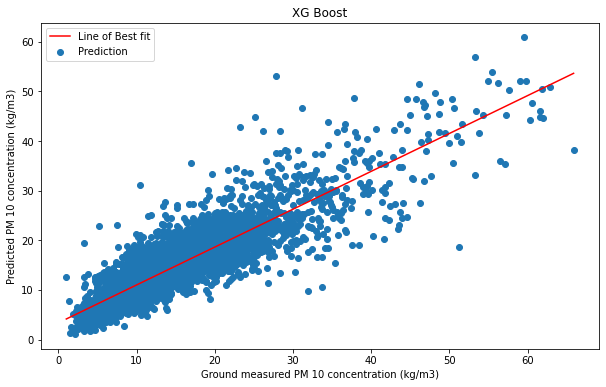

In [79]:
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_xgb = pd.DataFrame(y_pred_xgb, columns = ['xgb'])
xgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_xgb).reset_index().drop(['index', 'level_0'], axis =1)
xgb_outlier = xgb_outlier[xgb_outlier['PM10']<70]

plt.figure(figsize =(10,6))
plt.scatter(xgb_outlier['PM10'], xgb_outlier['xgb'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(xgb_outlier['PM10']), np.poly1d(np.polyfit(xgb_outlier['PM10'], xgb_outlier['xgb'], 1))(np.unique(xgb_outlier['PM10'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 10 concentration (kg/m3)')
plt.ylabel('Predicted PM 10 concentration (kg/m3)')
plt.title('XG Boost')
# plt.savefig('RF.png')
plt.legend()

# Light GBM

In [23]:
pipe_LGBM = Pipeline([
        ('scale', StandardScaler()), ('LGBM', LGBMRegressor())])
pipe_LGBM.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'LGBM', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'LGBM__boosting_type', 'LGBM__class_weight', 'LGBM__colsample_bytree', 'LGBM__importance_type', 'LGBM__learning_rate', 'LGBM__max_depth', 'LGBM__min_child_samples', 'LGBM__min_child_weight', 'LGBM__min_split_gain', 'LGBM__n_estimators', 'LGBM__n_jobs', 'LGBM__num_leaves', 'LGBM__objective', 'LGBM__random_state', 'LGBM__reg_alpha', 'LGBM__reg_lambda', 'LGBM__silent', 'LGBM__subsample', 'LGBM__subsample_for_bin', 'LGBM__subsample_freq'])

In [24]:
# Hypterparameter tuning was conducted using GridSearchCV
# Parametrs were determined based on the results obtained from GridSearchCV
# start_time = time.time()
params = {'LGBM__max_depth': [20],
          'LGBM__learning_rate':[0.1],
          'LGBM__num_leaves':[400],
          'LGBM__reg_lambda':[500],
          'LGBM__n_estimators': [800]
         }
LGBM_search = GridSearchCV(pipe_LGBM,params,n_jobs=-1,cv=5,verbose=2)
LGBM_search.fit(X_train.drop('Date', axis = 1),y_train.values.ravel())
# print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('LGBM', LGBMRegressor())]),
             n_jobs=-1,
             param_grid={'LGBM__learning_rate': [0.1], 'LGBM__max_depth': [20],
                         'LGBM__n_estimators': [800], 'LGBM__num_leaves': [400],
                         'LGBM__reg_lambda': [500]},
             verbose=2)

In [25]:
print('Score on train data: {}\n'.format(LGBM_search.score(X_train.drop('Date', axis = 1),y_train.values.ravel())))
print('Best parameters found:')
display(LGBM_search.best_params_)

Score on train data: 0.9714357284437889

Best parameters found:


{'LGBM__learning_rate': 0.1,
 'LGBM__max_depth': 20,
 'LGBM__n_estimators': 800,
 'LGBM__num_leaves': 400,
 'LGBM__reg_lambda': 500}

In [26]:
print('best cv score:')
display(LGBM_search.best_score_)

print('mean cv score:')
display(np.mean(LGBM_search.cv_results_["mean_test_score"]))

best cv score:


0.7587218710816087

mean cv score:


0.7587218710816087

In [27]:
LGBM_best_estim = LGBM_search.best_estimator_
print(LGBM_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('LGBM',
                 LGBMRegressor(max_depth=20, n_estimators=800, num_leaves=400,
                               reg_lambda=500))])


In [28]:
LGBM_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

LGBM_ytrain_pred = LGBM_best_estim.predict(X_train.drop('Date', axis = 1))


In [29]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
LGBM_rmse = np.sqrt(mean_squared_error(LGBM_ytrain_pred,  y_train.values.ravel()))
LGBM_r2 = r2_score(LGBM_ytrain_pred,y_train.values.ravel())
LGBM_mae = mean_absolute_error(LGBM_ytrain_pred,  y_train.values.ravel())
LGBM_mse = mean_squared_error(LGBM_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % LGBM_rmse)
print("MSE: %.2f" % LGBM_mse)
print("MAE: %.2f" % LGBM_mae)
print("R2: %.2f" % LGBM_r2)

RMSE: 1.37
MSE: 1.88
MAE: 0.86
R2: 0.97


In [30]:
y_pred_LGBM = LGBM_best_estim.predict(X_test.drop('Date', axis =1))

In [31]:
y_pred_LGBM_coord = LGBM_best_estim.predict(X_test_coord.drop(['Lat','Long'], axis = 1))

In [32]:
y_pred_LGBM_coord_df = pd.DataFrame(y_pred_LGBM_coord, columns = ['PM10 Prediction'])
all_coord_predictions = pd.DataFrame.join(X_test_coord[['Lat','Long']], y_pred_LGBM_coord_df)

In [45]:
import os
from urllib.request import urlretrieve
from urllib.request import urlopen
from bs4 import BeautifulSoup
import plotly.graph_objects as go # or plotly.express as px
import pandas as pd
import numpy as np
import re
import json
import numpy as np
import timeit 
from datetime import datetime
from plotly.offline import iplot
from scipy.interpolate import griddata
from numpy import linspace
import plotly.express as px
from shapely.geometry import Polygon, MultiPolygon
import matplotlib.pyplot as plt

trace0=go.Scattermapbox(
            lat=all_coord_predictions['Lat'],
            lon= all_coord_predictions['Long'],
          
            mode='markers',
            marker=dict(
                opacity=0.5, 
                size=10, 
                color= all_coord_predictions['PM10 Prediction'],
                cmax=20000,
                showscale=True),
            
           
            )



data=[trace0]

layout = go.Layout(
    title="Spatial PM10 concentration (μg/m3) ",  
    title_x=0.4,
   
    
    
    height = 800,
    # top, bottom, left and right margins
    margin = dict(t = 80, b = 0, l = 0, r = 0),
    font = dict(color = 'dark grey', size = 14),
 
    mapbox = dict(
       

        center = dict(
            lat = 55.3781,
            lon = 3.4360
        ),
        # default level of zoom
        zoom = 5,
        # default map style
        style = "open-street-map"
    )

)

figure=go.Figure(
    data=data,
    layout=layout,
  
    )



iplot(figure)

In [34]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_LGBM = pd.DataFrame(y_pred_LGBM, columns = ['LGBM'])
LGBM_outlier = pd.DataFrame.join(y_test_outlier, y_pred_LGBM).reset_index().drop(['index', 'level_0'], axis =1)
LGBM_outlier = LGBM_outlier[LGBM_outlier['PM10']< 70]

# plt.figure(figsize =(10,6))
# plt.scatter(lgb_outlier['PM25'], lgb_outlier['LGBM'], label = 'Prediction', cmap = 'inferno')
# plt.plot(np.unique(lgb_outlier['PM25']), np.poly1d(np.polyfit(lgb_outlier['PM25'], lgb_outlier['LGBM'], 1))(np.unique(lgb_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
# plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
# plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
# plt.title('Light Gradient Boosting Machine')
# # plt.savefig('LGBM.png')
# plt.legend()


df = LGBM_outlier
fig = px.scatter(df, x='PM10', y='LGBM', trendline="ols", trendline_color_override = 'red',
                labels={
                     "LGBM": " Predicted PM 10 Concentration (μg/m3)",
                     "PM10": "Ground Measured PM 10 (μg/m3)"})

fig.update_layout(title_text='LightGBM PM10 Concentration against Ground Measurements')
fig.show()

In [38]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_LGBM = pd.DataFrame(y_pred_LGBM, columns = ['LGBM'])
LGBM_outlier = pd.DataFrame.join(y_test_outlier, y_pred_LGBM).reset_index().drop(['index', 'level_0'], axis =1)
LGBM_outlier = LGBM_outlier[LGBM_outlier['PM10']< 70]

# plt.figure(figsize =(10,6))
# plt.scatter(LGBM_outlier['PM10'], LGBM_outlier['LGBM'], label = 'Prediction', cmap = 'inferno')
# plt.plot(np.unique(LGBM_outlier['PM10']), np.poly1d(np.polyfit(LGBM_outlier['PM10'], LGBM_outlier['LGBM'], 1))(np.unique(LGBM_outlier['PM10'])), color = 'red', label = 'Line of Best fit')
# plt.xlabel('Ground measured PM 10 concentration (kg/m3)')
# plt.ylabel('Predicted PM 10 concentration (kg/m3)')
# plt.title('LGBM')
# # plt.savefig('RF.png')
# plt.legend()

df = LGBM_outlier
fig = px.scatter(df, x='PM10', y='LGBM', trendline="ols", trendline_color_override = 'red',
                labels={
                     "LGBM": " Predicted PM10 Concentration (μg/m3)",
                     "PM10": "Ground Measurement PM10 (μg/m3)"})

fig.update_layout(title_text='LGBM PM10 Concentration against Ground Measurements')
fig.show()

# Correlations

In [35]:
# predict_pm10_dtree = pd.DataFrame(y_pred_dtree, columns = ['Predict DTree'])
# predict_pm10_rforest = pd.DataFrame(y_pred_rforest_coord, columns = ['Predict Rforest'])
# predict_pm10_gboost = pd.DataFrame(y_pred_gboost_coord, columns = ['Predict Gboost'])
# predict_pm10_xgb = pd.DataFrame(y_pred_xgb_coord, columns = ['Predict XGB'])
predict_pm10_lgb = pd.DataFrame(y_pred_LGBM_coord, columns = ['Predict LGBM'])

In [36]:
respiratory = [749,721,797,935,926,610,845,708,554,680,655,652,736,553,585,
618,637,711,823,639,806,808,1087,689,651,681,628,615,608,676,619,573,835,733,
733,896,681,941,863,600,567,739,850,852,859,]
respiratory_disease = pd.DataFrame(respiratory, columns = ['Respiratory'])

asthma = [75,35,49,72,70,45,42,49,43,46,43,54,48,34,38,38,46,60,63,32,58,45,85,40,36,37,40,41,36,33,32,37,52,
          66,45,51,42,63,50,35,31,46,49,61,47]
asthma_df = pd.DataFrame(asthma, columns = ['Asthma'])

copd = [130,117,214,229,205,90,194,115,90,111,110,106,157,79,94,115,93,165,110,
105,121,103,196,116,116,136,103,122,101,100,81,88,192,142,144,191,140,192,163,112,88,136,159,177,161]
copd_df = pd.DataFrame(copd, columns = ['COPD'])

In [37]:
coordinates = pd.read_csv('Coordinates_updated_long-Copy1.csv')
correlation = pd.DataFrame.join(predict_pm10_rforest, predict_pm10_dtree)
correlation = correlation.join(predict_pm10_gboost)
correlation = correlation.join(predict_pm10_xgb)
correlation = correlation.join(predict_pm10_lgb)
correlation = correlation.join(coordinates['location'])

NameError: name 'predict_pm10_rforest' is not defined

In [40]:
correlation_groupby = correlation.groupby('location',sort = False, as_index=False).mean(lambda x: set(x))

AttributeError: 'function' object has no attribute 'groupby'

In [39]:
correlation_groupby = correlation_groupby.join(respiratory_disease)
correlation_groupby = correlation_groupby.join(asthma_df)
correlation_groupby = correlation_groupby.join(copd_df)

NameError: name 'correlation_groupby' is not defined

In [133]:
correlation_groupby.head()

,location,Predict Rforest,Predict DTree,Predict Gboost,Predict XGB,Predict LGBM,Respiratory,Asthma,COPD
0,Northumberland,8.011528,14.056589,8.175564,6.451908,7.369869,749,75,130
1,North Cumbria & Morecambe Bay,7.504437,14.642961,7.651528,9.154845,8.123627,721,35,117
2,County Durham,8.721945,10.665484,8.511402,10.932088,6.813541,797,49,214
3,"Newcastle, Tyneside & Sunderland",11.747926,11.905015,10.138147,8.601964,9.809585,935,72,229
4,Tees Valley,14.044316,12.918199,14.519661,11.998005,13.445448,926,70,205


Pearson Dtree, Respiratory: -0.055245821560972415
Pearson Rforest, Respiratory: 0.24036157437501188
Pearson GBoost, Respiratory: 0.296299351624016
Pearson XGB, Respiratory: 0.11464897722633431
Pearson LGBM, Respiratory: 0.28306092276715883

spearmanr Dtree, Respiratory: 0.0034916661252398936
spearmanr Rforest, Respiratory: 0.1968509128720151
spearmanr GBoost, Respiratory: 0.22695829814059307
spearmanr XGB, Respiratory: 0.05968772659372345
spearmanr LGBM, Respiratory: 0.2058106599103665


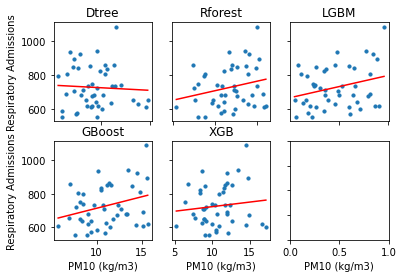

<Figure size 1080x504 with 0 Axes>

In [152]:
# Respiratory

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (15,7))

resp_outlier = correlation_groupby[['Predict DTree', 'Predict Rforest', 'Predict Gboost', 'Predict XGB', 'Predict LGBM',
                                   'Respiratory']]
# resp_outlier = resp_outlier[(resp_outlier['Predict DTree'] <15) & (resp_outlier['Predict Rforest'] <15)
#                             & (resp_outlier['Predict Gboost'] <15)  & (resp_outlier['Predict XGB'] <15) &
#                            (resp_outlier['Predict LGBM'] <15)]

axs[0, 0].scatter(resp_outlier['Predict DTree'], resp_outlier['Respiratory'], s = 10, label = 'Correlation')
axs[0, 0].set_title('Dtree')
axs[0, 0].plot(np.unique(resp_outlier['Predict DTree']), np.poly1d(np.polyfit(resp_outlier['Predict DTree'], resp_outlier['Respiratory'], 1))(np.unique(resp_outlier['Predict DTree'])), 
color = 'red', label ='Line of best fit')

axs[0, 1].scatter(resp_outlier['Predict Rforest'], resp_outlier['Respiratory'], s = 10)
axs[0, 1].set_title('Rforest')
axs[0, 1].plot(np.unique(resp_outlier['Predict Rforest']), np.poly1d(np.polyfit(resp_outlier['Predict Rforest'], resp_outlier['Respiratory'], 1))(np.unique(resp_outlier['Predict Rforest'])), color = 'red')

axs[1, 0].scatter(resp_outlier['Predict Gboost'], resp_outlier['Respiratory'], s = 10)
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(resp_outlier['Predict Gboost']), np.poly1d(np.polyfit(resp_outlier['Predict Gboost'], resp_outlier['Respiratory'], 1))(np.unique(resp_outlier['Predict Gboost'])), color = 'red')

axs[1, 1].scatter(resp_outlier['Predict XGB'], resp_outlier['Respiratory'], s = 10)
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(resp_outlier['Predict XGB']), np.poly1d(np.polyfit(resp_outlier['Predict XGB'], resp_outlier['Respiratory'], 1))(np.unique(resp_outlier['Predict XGB'])), color = 'red')

axs[0, 2].scatter(resp_outlier['Predict LGBM'], resp_outlier['Respiratory'], s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(resp_outlier['Predict LGBM']), np.poly1d(np.polyfit(resp_outlier['Predict LGBM'], resp_outlier['Respiratory'], 1))(np.unique(resp_outlier['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM10 (kg/m3)', ylabel='Respiratory Admissions')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()


    
# Pearson
print('Pearson Dtree, Respiratory:', pearsonr(correlation_groupby['Predict DTree'],
         correlation_groupby['Respiratory'])[0])
print('Pearson Rforest, Respiratory:', pearsonr(correlation_groupby['Predict Rforest'],
         correlation_groupby['Respiratory'])[0])
print('Pearson GBoost, Respiratory:', pearsonr(correlation_groupby['Predict Gboost'],
         correlation_groupby['Respiratory'])[0])
print('Pearson XGB, Respiratory:', pearsonr(correlation_groupby['Predict XGB'],
         correlation_groupby['Respiratory'])[0])
print('Pearson LGBM, Respiratory:', pearsonr(correlation_groupby['Predict LGBM'],
         correlation_groupby['Respiratory'])[0])

print()

# Spearman
print('spearmanr Dtree, Respiratory:', spearmanr(correlation_groupby['Predict DTree'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr Rforest, Respiratory:', spearmanr(correlation_groupby['Predict Rforest'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr GBoost, Respiratory:', spearmanr(correlation_groupby['Predict Gboost'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr XGB, Respiratory:', spearmanr(correlation_groupby['Predict XGB'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr LGBM, Respiratory:', spearmanr(correlation_groupby['Predict LGBM'],
         correlation_groupby['Respiratory'])[0])

# Respiratory

Pearson Dtree, Asthma: -0.040397654509748984
Pearson Rforest, Asthma: 0.03547722175420408
Pearson GBoost, Asthma: 0.10441809604090518
Pearson XGB, Asthma: -0.11740796363906042
Pearson LGBM, Asthma: 0.05342938880430434

Spearmanr Dtree, Asthma: -0.008240220834203036
Spearmanr Rforest, Asthma: 0.004218993067111955
Spearmanr GBoost, Asthma: 0.0401463559042372
Spearmanr XGB, Asthma: -0.185635694952926
Spearmanr LGBM, Asthma: -0.05689048463933777


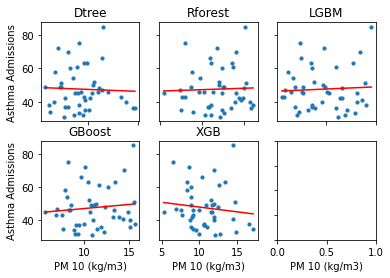

<Figure size 1440x864 with 0 Axes>

In [153]:
# Asthma

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (20,12))

asthma_outlier = correlation_groupby[['Predict DTree', 'Predict Rforest', 'Predict Gboost', 'Predict XGB', 'Predict LGBM',
                                   'Asthma']]

asthma_outlier = asthma_outlier[asthma_outlier['Asthma']>30]

axs[0, 0].scatter(asthma_outlier['Predict DTree'], asthma_outlier['Asthma'], s = 10)
axs[0, 0].set_title('Dtree')
axs[0, 0].plot(np.unique(asthma_outlier['Predict DTree']), np.poly1d(np.polyfit(asthma_outlier['Predict DTree'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict DTree'])), color = 'red')

axs[0, 1].scatter(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma'], s = 10 )
axs[0, 1].set_title('Rforest')
axs[0, 1].plot(np.unique(asthma_outlier['Predict Rforest']), np.poly1d(np.polyfit(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict Rforest'])), color = 'red')

axs[1, 0].scatter(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma'], s = 10 )
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(asthma_outlier['Predict Gboost']), np.poly1d(np.polyfit(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict Gboost'])), color = 'red')

axs[1, 1].scatter(asthma_outlier['Predict XGB'], asthma_outlier['Asthma'], s = 10 )
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(asthma_outlier['Predict XGB']), np.poly1d(np.polyfit(asthma_outlier['Predict XGB'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict XGB'])), color = 'red')

axs[0, 2].scatter(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma'], s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(asthma_outlier['Predict LGBM']), np.poly1d(np.polyfit(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM 10 (kg/m3)', ylabel='Asthma Admissions')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    

    from scipy.stats import pearsonr
from scipy.stats import spearmanr

print('Pearson Dtree, Asthma:', pearsonr(asthma_outlier['Predict DTree'],
         asthma_outlier['Asthma'])[0])
print('Pearson Rforest, Asthma:', pearsonr(asthma_outlier['Predict Rforest'],
         asthma_outlier['Asthma'])[0])
print('Pearson GBoost, Asthma:', pearsonr(asthma_outlier['Predict Gboost'],
         asthma_outlier['Asthma'])[0])
print('Pearson XGB, Asthma:', pearsonr(asthma_outlier['Predict XGB'],
         asthma_outlier['Asthma'])[0])
print('Pearson LGBM, Asthma:', pearsonr(asthma_outlier['Predict LGBM'],
         asthma_outlier['Asthma'])[0])

print()


# Spearman
print('Spearmanr Dtree, Asthma:', spearmanr(asthma_outlier['Predict DTree'],
         asthma_outlier['Asthma'])[0])
print('Spearmanr Rforest, Asthma:', spearmanr(asthma_outlier['Predict Rforest'],
         asthma_outlier['Asthma'])[0])
print('Spearmanr GBoost, Asthma:', spearmanr(asthma_outlier['Predict Gboost'],
         asthma_outlier['Asthma'])[0])
print('Spearmanr XGB, Asthma:', spearmanr(asthma_outlier['Predict XGB'],
         asthma_outlier['Asthma'])[0])
print('Spearmanr LGBM, Asthma:', spearmanr(asthma_outlier['Predict LGBM'],
         asthma_outlier['Asthma'])[0])

# Asthma

Pearson, Dtree, COPD: -0.1428567829386178
Pearson, Rforest, COPD: 0.28724622295740077
Pearson, GBoost, COPD: 0.2949581472117301
Pearson, XGB, COPD: 0.1843777647874238
Pearson, LGBM, COPD: 0.26795183760349506

Spearman Dtree, COPD: -0.033737481403838324
Spearman Rforest, COPD: 0.2956642169121535
Spearman GBoost, COPD: 0.3093041752140959
Spearman XGB, COPD: 0.18898261067618813
Spearman LGBM, COPD: 0.2772140317694294


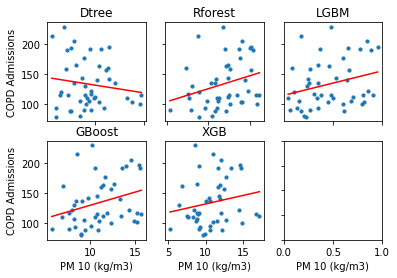

<Figure size 1440x864 with 0 Axes>

In [154]:
# COPD

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (20,12))

copd_outlier = correlation_groupby[['Predict DTree', 'Predict Rforest', 'Predict Gboost', 'Predict XGB', 'Predict LGBM',
                                   'COPD']]

copd_outlier = copd_outlier[copd_outlier['COPD'] <1000]
axs[0, 0].scatter(copd_outlier['Predict DTree'], copd_outlier['COPD'], s = 10)
axs[0, 0].plot(np.unique(copd_outlier['Predict DTree']), np.poly1d(np.polyfit(copd_outlier['Predict DTree'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict DTree'])), color = 'red')
axs[0, 0].set_title('Dtree')


axs[0, 1].scatter(copd_outlier['Predict Rforest'], copd_outlier['COPD'],s = 10 )
axs[0, 1].plot(np.unique(copd_outlier['Predict Rforest']), np.poly1d(np.polyfit(copd_outlier['Predict Rforest'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict Rforest'])), color = 'red')
axs[0, 1].set_title('Rforest')


axs[1, 0].scatter(copd_outlier['Predict Gboost'], copd_outlier['COPD'],s = 10 )
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(copd_outlier['Predict Gboost']), np.poly1d(np.polyfit(copd_outlier['Predict Gboost'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict Gboost'])), color = 'red')


axs[1, 1].scatter(copd_outlier['Predict XGB'], copd_outlier['COPD'],s = 10 )
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(copd_outlier['Predict XGB']), np.poly1d(np.polyfit(copd_outlier['Predict XGB'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict XGB'])), color = 'red')


axs[0, 2].scatter(copd_outlier['Predict LGBM'], copd_outlier['COPD'],s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(copd_outlier['Predict LGBM']), np.poly1d(np.polyfit(copd_outlier['Predict LGBM'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM 10 (kg/m3)', ylabel='COPD Admissions')
    ax.label_outer()
    
# Pearson
print('Pearson, Dtree, COPD:', pearsonr(copd_outlier['Predict DTree'],
         copd_outlier['COPD'])[0])
print('Pearson, Rforest, COPD:', pearsonr(copd_outlier['Predict Rforest'],
         copd_outlier['COPD'])[0])
print('Pearson, GBoost, COPD:', pearsonr(copd_outlier['Predict Gboost'],
         copd_outlier['COPD'])[0])
print('Pearson, XGB, COPD:', pearsonr(copd_outlier['Predict XGB'],
         copd_outlier['COPD'])[0])
print('Pearson, LGBM, COPD:', pearsonr(copd_outlier['Predict LGBM'],
         copd_outlier['COPD'])[0])
    
print()

# Spearman
print('Spearman Dtree, COPD:', spearmanr(copd_outlier['Predict DTree'],
         copd_outlier['COPD'])[0])
print('Spearman Rforest, COPD:', spearmanr(copd_outlier['Predict Rforest'],
         copd_outlier['COPD'])[0])
print('Spearman GBoost, COPD:', spearmanr(copd_outlier['Predict Gboost'],
         copd_outlier['COPD'])[0])
print('Spearman XGB, COPD:', spearmanr(copd_outlier['Predict XGB'],
         copd_outlier['COPD'])[0])
print('Spearman LGBM, COPD:', spearmanr(copd_outlier['Predict LGBM'],
         copd_outlier['COPD'])[0])

# COPD

In [137]:
correlation_groupby.to_csv('Full_Correlation_PM10.csv')

In [41]:
correlation_groupby = pd.read_csv('Full_Correlation_PM10.csv')

In [42]:
asthma_19 = [81,73,90,98,83,48,47,80,62,86,55,56,59,54,62,60,63,
60,80,62,100,95,35,53,69,46,74,55,37,75,36,48,56,52,
52,71,46,91,97,70,51,66,70,105,119]


In [43]:
asthma_all_ages = []



for (item1, item2) in zip(asthma, asthma_19):
    asthma_all_ages.append(item1+item2)

print(asthma_all_ages)

[156, 108, 139, 170, 153, 93, 89, 129, 105, 132, 98, 110, 107, 88, 100, 98, 109, 120, 143, 94, 158, 140, 120, 93, 105, 83, 114, 96, 73, 108, 68, 85, 108, 118, 97, 122, 88, 154, 147, 105, 82, 112, 119, 166, 166]


In [44]:
asthma_all_ages_df = pd.DataFrame(asthma_all_ages, columns = ['Asthma All Ages'])

In [45]:
correlation_groupby =correlation_groupby.join(asthma_all_ages_df)

In [46]:
correlation_groupby = correlation_groupby.drop('Unnamed: 0', axis = 1)

In [53]:
import plotly.graph_objects as go


fig = go.Figure(
    data=[
        go.Bar(name='Asthma Admissions', x=correlation_groupby['location'], y=correlation_groupby['Asthma All Ages'], yaxis='y', offsetgroup=1),
        go.Bar(name='PM10 (μg/m3)', x=correlation_groupby['location'], y=correlation_groupby['Predict LGBM'], yaxis='y2', offsetgroup=2)
    ],
    layout={
        'yaxis': {'title': 'Asthma Admissions'},
        'yaxis2': {'title': 'PM10 (μg/m3)', 'overlaying': 'y', 'side': 'right'}
    }
)

# Change the bar mode
# fig.update_layout(barmode='group')
fig.update_layout(
    autosize=False,
    width=1020,
    height=700,)

fig.show()

In [31]:
import plotly.express as px
LGBM_importances = pd.DataFrame(LGBM_best_estim.steps[1][1].feature_importances_, columns = ['Importances'])
Features_new = pd.DataFrame(['NDVI', 'NDVI Quality Assessment','Elevation','Average Cloud-Free Light','Cloud Free coverage',
           'Population Density', 'Precipitable Water','Relative Humidity','Horizontal Component of Wind','Vertical Component of Wind',
           'NO2 column number density','NO2 Slant column number density','NO2 Stratospheric column number denisty', 'Tropopause Pressure',
           'NO2 Tropospheric column number density','O3 column number Density','CO column number density', 'Cloud Coverage',
           'AOD'], columns = ['Feature'])
Features = pd.DataFrame(X_train.columns, columns = ['Features'])
Features = Features.rename({'U Wind': 'Horizontal Component of Wind', 'V Wind': 'Vertical Component of Wind',
                          'O3': 'O3 column number Density', 'Cloud': 'Cloud Coverage', 'CO': 'CO column number density',
                          'RH': 'Relative Humidity', 'NO2 Column':'NO2 column number density','NO2 Trop': 'NO2 Tropospheric column number density',
                          'Pressure': 'Tropopause Pressure', 'NO2 Strat': 'NO2 Stratospheric column number denisty', 'Avg':'Average Cloud-Free Light',
                          'CF_avg': 'Cloud Free coverage', 'QA':'NDVI Quality Assessment'})

combo = pd.DataFrame.join(LGBM_importances, Features_new)

In [32]:
df_importance = combo.sort_values(by = 'Importances')
fig = px.bar(df_importance, x="Importances", y="Feature", orientation='h')
fig.show()

In [59]:
# # X_test['Date'].to_csv('X_test_Date.csv')
y_pred_LGBM.to_csv('Predictions_temporal.csv')
# y_test_df = pd.DataFrame({'y_test':y_test})
# y_test_df.to_csv('y_test_df.csv')

In [60]:
predictions_by_date = pd.read_csv('PREDICTIONS_BY_DATE_Pm10.csv')

In [72]:
import plotly.express as px

df = predictions_by_date[predictions_by_date['y_test']<80]
# fig = px.line(df, x='Date', y="Y_test", color_discrete_sequence=['blue'])
# fig = px.line(df, x = 'Date', y = 'Predictions',color_discrete_sequence=["red"])
fig = px.line(df, x='Date', y=df.columns[1:])
fig.update_xaxes(
    ticktext=["10/2018", "11/2018", "12/2018", "01/2019","02/2019", "03/2019", "04/2019", "05/2019",
             "06/2019", "07/2019", "08/2019", "09/2019", "10/2019", "11/2019", "12/2019", "01/2020", "02/2020", "03/2020"],
tickvals=["10/10/2018", "16/11/2018", "16/12/2018", "15/01/2019", "15/02/2019", "15/03/2019", "15/04/2019",
             "15/05/2019", "15/06/2019", "15/07/2019", "15/08/2019", "15/09/2019", "15/10/2019", "15/11/2019",
             "15/12/2019", "15/01/2020", "15/02/2020", "15/03/2020"])
fig.update_layout(title="Temporal variation of PM10",yaxis_title="PM10 Concentration (μg/m3)",)
fig.show()

Pearson Dtree, Asthma All Ages: 0.0025368706900207316
Pearson Rforest, Asthma All Ages: 0.09786852191287551
Pearson GBoost, Asthma All Ages: 0.15167635722453507
Pearson XGB, Asthma All Ages: -0.12482888627988303
Pearson LGBM, Asthma All Ages: 0.04354845209959222

Spearmanr Dtree, Asthma All Ages: 0.030090614219915726
Spearmanr Rforest, Asthma All Ages: 0.11318174212263755
Spearmanr GBoost, Asthma All Ages: 0.12173021207147725
Spearmanr XGB, Asthma All Ages: -0.22807317823504306
Spearmanr LGBM, Asthma: -0.04342622734010565


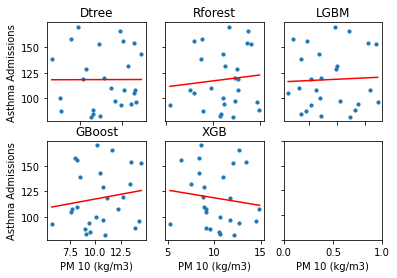

<Figure size 1440x864 with 0 Axes>

In [25]:
# Asthma

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (20,12))

asthma_outlier = correlation_groupby[['Predict DTree', 'Predict Rforest', 'Predict Gboost', 'Predict XGB', 'Predict LGBM',
                                   'Asthma All Ages']]

asthma_outlier = asthma_outlier[asthma_outlier['Asthma All Ages']>75]

asthma_outlier = asthma_outlier[(asthma_outlier['Predict DTree'] <15) & (asthma_outlier['Predict Rforest'] <15)
                            & (asthma_outlier['Predict Gboost'] <15)  & (asthma_outlier['Predict XGB'] <15) &
                           (asthma_outlier['Predict LGBM'] <15)]

axs[0, 0].scatter(asthma_outlier['Predict DTree'], asthma_outlier['Asthma All Ages'], s = 10)
axs[0, 0].set_title('Dtree')
axs[0, 0].plot(np.unique(asthma_outlier['Predict DTree']), np.poly1d(np.polyfit(asthma_outlier['Predict DTree'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict DTree'])), color = 'red')

axs[0, 1].scatter(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma All Ages'], s = 10 )
axs[0, 1].set_title('Rforest')
axs[0, 1].plot(np.unique(asthma_outlier['Predict Rforest']), np.poly1d(np.polyfit(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict Rforest'])), color = 'red')

axs[1, 0].scatter(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma All Ages'], s = 10 )
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(asthma_outlier['Predict Gboost']), np.poly1d(np.polyfit(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict Gboost'])), color = 'red')

axs[1, 1].scatter(asthma_outlier['Predict XGB'], asthma_outlier['Asthma All Ages'], s = 10 )
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(asthma_outlier['Predict XGB']), np.poly1d(np.polyfit(asthma_outlier['Predict XGB'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict XGB'])), color = 'red')

axs[0, 2].scatter(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma All Ages'], s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(asthma_outlier['Predict LGBM']), np.poly1d(np.polyfit(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM 10 (kg/m3)', ylabel='Asthma Admissions')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    

    from scipy.stats import pearsonr
from scipy.stats import spearmanr

print('Pearson Dtree, Asthma All Ages:', pearsonr(asthma_outlier['Predict DTree'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson Rforest, Asthma All Ages:', pearsonr(asthma_outlier['Predict Rforest'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson GBoost, Asthma All Ages:', pearsonr(asthma_outlier['Predict Gboost'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson XGB, Asthma All Ages:', pearsonr(asthma_outlier['Predict XGB'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson LGBM, Asthma All Ages:', pearsonr(asthma_outlier['Predict LGBM'],
         asthma_outlier['Asthma All Ages'])[0])

print()


# Spearman
print('Spearmanr Dtree, Asthma All Ages:', spearmanr(asthma_outlier['Predict DTree'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr Rforest, Asthma All Ages:', spearmanr(asthma_outlier['Predict Rforest'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr GBoost, Asthma All Ages:', spearmanr(asthma_outlier['Predict Gboost'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr XGB, Asthma All Ages:', spearmanr(asthma_outlier['Predict XGB'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr LGBM, Asthma:', spearmanr(asthma_outlier['Predict LGBM'],
         asthma_outlier['Asthma All Ages'])[0])

# Asthma